In [1]:
# Custom implementation of https://github.com/anoff/deep-emoji-gan
!git clone https://github.com/iamcal/emoji-data

Cloning into 'emoji-data'...
remote: Enumerating objects: 116045, done.
remote: Total 116045 (delta 0), reused 0 (delta 0), pack-reused 116045
Receiving objects: 100% (116045/116045), 1.66 GiB | 47.51 MiB/s, done.
Resolving deltas: 100% (26974/26974), done.
Checking out files: 100% (22601/22601), done.


In [0]:
import pickle as pkl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import tensorflow as tf
import json
import glob
import random
%matplotlib inline

In [0]:
# Open the emoji json file

with open('emoji-data/emoji.json') as data_file:
    emojis = json.load(data_file)

In [4]:
[e for e in emojis if e["category"] == "Smileys & People"]

[{'added_in': '6.0',
  'au': 'EAF0',
  'category': 'Smileys & People',
  'docomo': None,
  'google': 'FE513',
  'has_img_apple': True,
  'has_img_facebook': True,
  'has_img_google': True,
  'has_img_messenger': True,
  'has_img_twitter': True,
  'image': '1f385.png',
  'name': 'FATHER CHRISTMAS',
  'non_qualified': None,
  'sheet_x': 8,
  'sheet_y': 19,
  'short_name': 'santa',
  'short_names': ['santa'],
  'skin_variations': {'1F3FB': {'added_in': '8.0',
    'has_img_apple': True,
    'has_img_facebook': True,
    'has_img_google': True,
    'has_img_messenger': True,
    'has_img_twitter': True,
    'image': '1f385-1f3fb.png',
    'non_qualified': None,
    'sheet_x': 8,
    'sheet_y': 20,
    'unified': '1F385-1F3FB'},
   '1F3FC': {'added_in': '8.0',
    'has_img_apple': True,
    'has_img_facebook': True,
    'has_img_google': True,
    'has_img_messenger': True,
    'has_img_twitter': True,
    'image': '1f385-1f3fc.png',
    'non_qualified': None,
    'sheet_x': 8,
    'sheet_y'

In [5]:
# Filter to trainable smileys

smileys = [e for e in emojis if e["category"] == "Smileys & People"]

# filter for those with "face" in the name
smileys = [e for e in smileys if "face" in e["short_name"]]

print(f"Filtered down to {len(smileys)} from {len(emojis)}")
smileys[3]

Filtered down to 35 from 1568


{'added_in': '6.0',
 'au': 'E5AE',
 'category': 'Smileys & People',
 'docomo': 'E6F4',
 'google': 'FE324',
 'has_img_apple': True,
 'has_img_facebook': True,
 'has_img_google': True,
 'has_img_messenger': True,
 'has_img_twitter': True,
 'image': '1f635.png',
 'name': 'DIZZY FACE',
 'non_qualified': None,
 'sheet_x': 31,
 'sheet_y': 25,
 'short_name': 'dizzy_face',
 'short_names': ['dizzy_face'],
 'softbank': None,
 'sort_order': 67,
 'text': None,
 'texts': None,
 'unified': '1F635'}

In [6]:
# Get filepaths for all the smileys from above
paths = [
    "emoji-data/img-apple-64",
    "emoji-data/img-emojione-64",
    "emoji-data/img-facebook-64",
    "emoji-data/img-google-64",
    "emoji-data/img-messenger-64",
    "emoji-data/img-twitter-64"
]
filenames = [s["image"] for s in smileys]
filepaths = []
for p in paths:
    image_paths = glob.glob(p + "/*.png")
    filtered = [p for p in image_paths if p.split("/")[-1] in filenames]
    filepaths = filepaths + filtered
    
len(filepaths)

145

In [0]:
def is_emoji(img):
    yellowishness = np.sum(np.logical_and(np.logical_and(img[:, :, 0] > 0.6, np.logical_and(img[:, :, 1] > 0.6, img[:, :, 3] > 0.8)), img[:, :, 2] < 0.6)) / np.sum(img[:, :, 2] < 0.6) 
    transparencyness = np.sum(img[:, :, 3] > 0.8) / (64 * 64)
    return yellowishness > 0.7 and transparencyness > 0.7

In [0]:
# strip transparency dimension (because RGB channels are crazy in transparencent spaces)
def strip_transparency(i):
    px_transparent = i[:, :, 3] < 0.1
    i[px_transparent, 0:3] = 1
    i = i[:, :, 0:3]
    return i

In [9]:
# load all files
images = [mpimg.imread(f) for f in filepaths]
print(len(images))
images = [i for i in images if i.shape == (64, 64, 4)]
#images = [i for i in images if is_emoji(i)]
images = [strip_transparency(i) for i in images]

print(len(images))

145
145


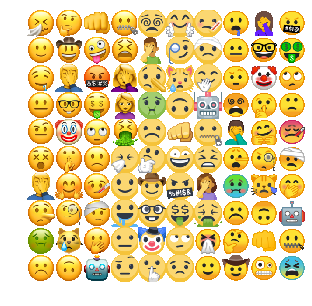

In [10]:
# See the emojis
lines = 10
f, axarr = plt.subplots(lines, lines, sharex=True, sharey=True, figsize=(5,5))
for i in range(lines**2):
    a = axarr[i%(lines), i//(lines)]
    img = images[i]
    a.axis("off")
    a.imshow(img)
plt.subplots_adjust(wspace=0, hspace=0)

In [0]:
scale_min_val=-1
scale_max_val=1
def scale(x):

    # scale to feature_range
    x = x * (scale_max_val - scale_min_val) + scale_min_val
    return x

def unscale(x):
    # scale to (0, 1)
   
    x = (x - scale_min_val) / (scale_max_val - scale_min_val)
    return x

In [0]:
def get_batches(images, batch_size, shuffle=True):
    images = np.array(images)
    if shuffle:
        idx = np.arange(len(images))
        np.random.shuffle(idx)
        images = images[idx]
    n_batches = len(images)//batch_size
    for i in range(0, len(images), batch_size):
        x = images[i:i+batch_size]
        yield x

In [13]:
i = scale(images[0])
print(i.shape)
print(np.max(i), np.min(i))

(64, 64, 3)
1.0 -0.9843137


In [0]:
# inputs
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(dtype=tf.float32, shape=(None, *real_dim), name="input_real")
    inputs_z = tf.placeholder(dtype=tf.float32, shape=(None, z_dim), name="input_z")

    return inputs_real, inputs_z

In [0]:
def generator(z, output_dim, reuse=False, alpha=0.2, is_train=True):
    alpha = 0.1
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        fc = tf.layers.dense(inputs=z, units=8*8*256, activation=None)
        conv1 = tf.reshape(fc, shape=(-1, 8, 8, 256))
        conv1 = tf.layers.batch_normalization(inputs=conv1, training=is_train)
        conv1 = tf.nn.relu(conv1)
        # > 8*8
        
        conv2 = tf.layers.conv2d_transpose(inputs=conv1, filters=128, kernel_size=5, strides=2, padding='SAME', activation=None)
        conv2 = tf.layers.batch_normalization(inputs=conv2, training=is_train)
        conv2 = tf.nn.relu(conv2)
        # > 16*16
        
        conv3 = tf.layers.conv2d_transpose(inputs=conv2, filters=64, kernel_size=5, strides=2, padding='SAME', activation=None)
        conv3 = tf.layers.batch_normalization(inputs=conv3, training=is_train)
        conv3 = tf.nn.relu(conv3)
        # > 32*32
        
        # Output layer, 64*64
        logits = tf.layers.conv2d_transpose(inputs=conv3, filters=output_dim, kernel_size=5, strides=2, padding='SAME', activation=None)
        
        out = tf.tanh(logits)
    
    return out

In [0]:
def discriminator(x, reuse=False, alpha=0.01):

    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 64*64
        conv1 = tf.layers.conv2d(inputs=x, filters=64, kernel_size=5, strides=2, padding='SAME', activation=None, kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv1 = tf.nn.relu(conv1)
        # > 32*32
        
        conv2 = tf.layers.conv2d(inputs=conv1, filters=128, kernel_size=5, strides=2, padding='SAME', activation=None)
        conv2 = tf.layers.batch_normalization(inputs=conv2, training=True)
        conv2 = tf.nn.relu(conv2)
        # > 16*16

        conv3 = tf.layers.conv2d(inputs=conv2, filters=256, kernel_size=5, strides=2, padding='SAME', activation=None)
        conv3 = tf.layers.batch_normalization(inputs=conv3, training=True)
        conv3 = tf.nn.relu(conv3)
        # > 8*8
        
        flat = tf.reshape(conv3, (-1, 8*8*256))
        logits = tf.layers.dense(inputs=flat, units=1, activation=None)
        out = tf.sigmoid(logits)
        
        return out, logits

In [0]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    smooth_factor = 0.1 # reduce true "correct" by this factor
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth_factor)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

In [0]:
def model_opt(d_loss, g_loss, learning_rate_d, learning_rate_g, beta1, beta2):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate_d, beta1=beta1, beta2=beta2).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate_g, beta1=beta1, beta2=beta2).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

In [0]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate_d, learning_rate_g, alpha=0.2, beta1=0.5, beta2=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate_d, learning_rate_g, beta1, beta2)

In [0]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = unscale(img)
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

In [0]:
def train(net, images, epochs, batch_size, print_every=10, show_every=30, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x in get_batches(images, batch_size):
                steps += 1
                x = [scale(i) for i in x]

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, is_train=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './cFinFheckpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

In [0]:
# hyper params
real_size = (64,64,3)
z_size = 64
# Lower learning rates for less loss with more epochs
learning_rate_d = 0.00009
learning_rate_g = 0.00005
batch_size = 768
epochs = 20000
beta1 = 0.6

# Create the network
net = GAN(real_size, z_size, learning_rate_d, learning_rate_g, beta1=beta1)

Epoch 10/20000... Discriminator Loss: 0.3703... Generator Loss: 3.7100
Epoch 20/20000... Discriminator Loss: 0.3619... Generator Loss: 4.0815
Epoch 30/20000... Discriminator Loss: 0.3584... Generator Loss: 3.8772
Epoch 40/20000... Discriminator Loss: 0.3890... Generator Loss: 3.0850
Epoch 50/20000... Discriminator Loss: 0.4646... Generator Loss: 2.2673
Epoch 60/20000... Discriminator Loss: 0.3760... Generator Loss: 3.4066
Epoch 70/20000... Discriminator Loss: 0.3680... Generator Loss: 3.8972
Epoch 80/20000... Discriminator Loss: 0.3930... Generator Loss: 3.1430
Epoch 90/20000... Discriminator Loss: 0.3885... Generator Loss: 3.4877
Epoch 100/20000... Discriminator Loss: 0.4161... Generator Loss: 2.7382
Epoch 110/20000... Discriminator Loss: 0.4582... Generator Loss: 5.0686
Epoch 120/20000... Discriminator Loss: 0.3678... Generator Loss: 5.1199
Epoch 130/20000... Discriminator Loss: 0.3668... Generator Loss: 4.1498
Epoch 140/20000... Discriminator Loss: 0.3603... Generator Loss: 3.9334
E

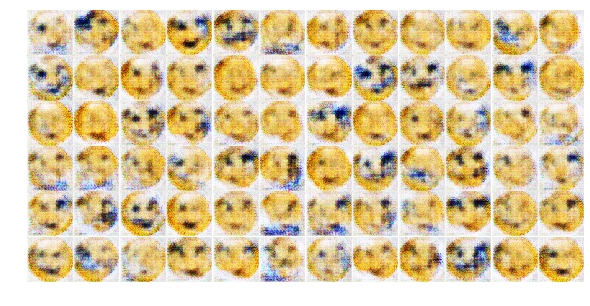

Epoch 310/20000... Discriminator Loss: 0.4904... Generator Loss: 5.3775
Epoch 320/20000... Discriminator Loss: 0.4864... Generator Loss: 2.8806
Epoch 330/20000... Discriminator Loss: 0.4288... Generator Loss: 4.9094
Epoch 340/20000... Discriminator Loss: 0.4627... Generator Loss: 2.7295
Epoch 350/20000... Discriminator Loss: 0.3650... Generator Loss: 4.2718
Epoch 360/20000... Discriminator Loss: 0.3871... Generator Loss: 3.3600
Epoch 370/20000... Discriminator Loss: 0.3781... Generator Loss: 3.5376
Epoch 380/20000... Discriminator Loss: 0.4085... Generator Loss: 4.7739
Epoch 390/20000... Discriminator Loss: 0.4199... Generator Loss: 2.9468
Epoch 400/20000... Discriminator Loss: 0.3626... Generator Loss: 3.9387
Epoch 410/20000... Discriminator Loss: 0.3722... Generator Loss: 4.9003
Epoch 420/20000... Discriminator Loss: 0.3523... Generator Loss: 4.2332
Epoch 430/20000... Discriminator Loss: 0.3637... Generator Loss: 4.5512
Epoch 440/20000... Discriminator Loss: 0.3636... Generator Loss:

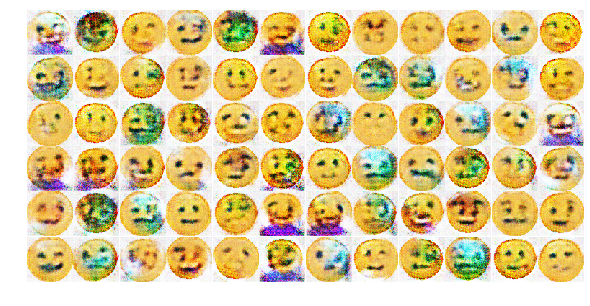

Epoch 610/20000... Discriminator Loss: 0.3816... Generator Loss: 4.0741
Epoch 620/20000... Discriminator Loss: 0.4170... Generator Loss: 4.5939
Epoch 630/20000... Discriminator Loss: 0.3710... Generator Loss: 4.0114
Epoch 640/20000... Discriminator Loss: 0.4562... Generator Loss: 2.6970
Epoch 650/20000... Discriminator Loss: 0.4557... Generator Loss: 5.0288
Epoch 660/20000... Discriminator Loss: 0.4413... Generator Loss: 2.7520
Epoch 670/20000... Discriminator Loss: 0.4591... Generator Loss: 5.0453
Epoch 680/20000... Discriminator Loss: 0.5012... Generator Loss: 2.3840
Epoch 690/20000... Discriminator Loss: 0.4308... Generator Loss: 2.8258
Epoch 700/20000... Discriminator Loss: 0.4026... Generator Loss: 4.5107
Epoch 710/20000... Discriminator Loss: 0.3704... Generator Loss: 3.6246
Epoch 720/20000... Discriminator Loss: 0.4266... Generator Loss: 2.9004
Epoch 730/20000... Discriminator Loss: 0.4096... Generator Loss: 4.6429
Epoch 740/20000... Discriminator Loss: 0.4481... Generator Loss:

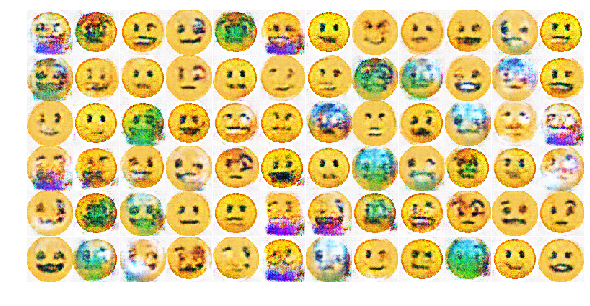

Epoch 910/20000... Discriminator Loss: 0.3632... Generator Loss: 4.2289
Epoch 920/20000... Discriminator Loss: 0.3804... Generator Loss: 4.7928
Epoch 930/20000... Discriminator Loss: 0.3627... Generator Loss: 4.3946
Epoch 940/20000... Discriminator Loss: 0.3585... Generator Loss: 4.0734
Epoch 950/20000... Discriminator Loss: 0.3894... Generator Loss: 4.9129
Epoch 960/20000... Discriminator Loss: 0.3631... Generator Loss: 4.4180
Epoch 970/20000... Discriminator Loss: 0.3957... Generator Loss: 3.3344
Epoch 980/20000... Discriminator Loss: 0.4329... Generator Loss: 5.5806
Epoch 990/20000... Discriminator Loss: 0.4242... Generator Loss: 3.1154
Epoch 1000/20000... Discriminator Loss: 0.3660... Generator Loss: 5.1427
Epoch 1010/20000... Discriminator Loss: 0.3431... Generator Loss: 4.5701
Epoch 1020/20000... Discriminator Loss: 0.4314... Generator Loss: 3.1054
Epoch 1030/20000... Discriminator Loss: 0.3535... Generator Loss: 4.2020
Epoch 1040/20000... Discriminator Loss: 0.3570... Generator 

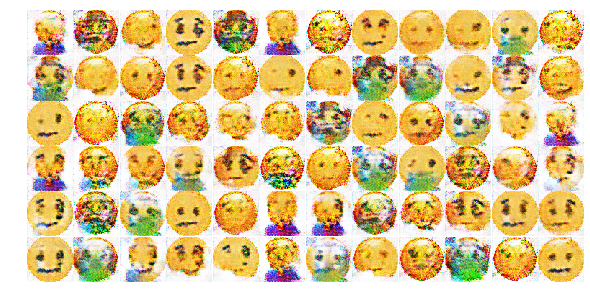

Epoch 1210/20000... Discriminator Loss: 0.3515... Generator Loss: 4.1852
Epoch 1220/20000... Discriminator Loss: 0.3477... Generator Loss: 4.4033
Epoch 1230/20000... Discriminator Loss: 0.4275... Generator Loss: 5.8188
Epoch 1240/20000... Discriminator Loss: 0.3919... Generator Loss: 3.5995
Epoch 1250/20000... Discriminator Loss: 0.3963... Generator Loss: 3.4649
Epoch 1260/20000... Discriminator Loss: 0.3684... Generator Loss: 3.9114
Epoch 1270/20000... Discriminator Loss: 0.4263... Generator Loss: 5.6788
Epoch 1280/20000... Discriminator Loss: 0.3936... Generator Loss: 3.5804
Epoch 1290/20000... Discriminator Loss: 0.4390... Generator Loss: 5.8151
Epoch 1300/20000... Discriminator Loss: 0.3525... Generator Loss: 4.7473
Epoch 1310/20000... Discriminator Loss: 0.3798... Generator Loss: 3.7081
Epoch 1320/20000... Discriminator Loss: 0.3718... Generator Loss: 3.7548
Epoch 1330/20000... Discriminator Loss: 0.3772... Generator Loss: 5.0275
Epoch 1340/20000... Discriminator Loss: 0.3552... G

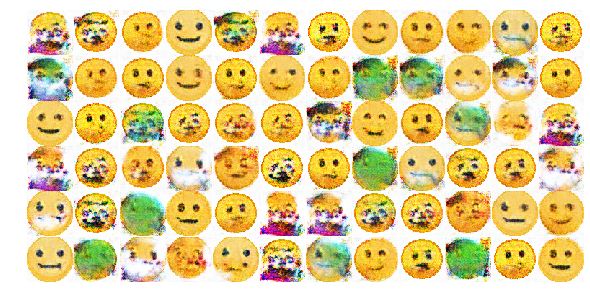

Epoch 1510/20000... Discriminator Loss: 0.3993... Generator Loss: 3.5512
Epoch 1520/20000... Discriminator Loss: 0.3747... Generator Loss: 3.9281
Epoch 1530/20000... Discriminator Loss: 0.4399... Generator Loss: 6.0487
Epoch 1540/20000... Discriminator Loss: 0.4046... Generator Loss: 5.9728
Epoch 1550/20000... Discriminator Loss: 0.3662... Generator Loss: 3.9858
Epoch 1560/20000... Discriminator Loss: 0.3557... Generator Loss: 4.6319
Epoch 1570/20000... Discriminator Loss: 0.3717... Generator Loss: 5.7527
Epoch 1580/20000... Discriminator Loss: 0.3947... Generator Loss: 3.7389
Epoch 1590/20000... Discriminator Loss: 0.3640... Generator Loss: 4.0774
Epoch 1600/20000... Discriminator Loss: 0.3886... Generator Loss: 3.7659
Epoch 1610/20000... Discriminator Loss: 0.3455... Generator Loss: 4.6162
Epoch 1620/20000... Discriminator Loss: 0.3375... Generator Loss: 5.2563
Epoch 1630/20000... Discriminator Loss: 0.3639... Generator Loss: 4.2343
Epoch 1640/20000... Discriminator Loss: 0.3507... G

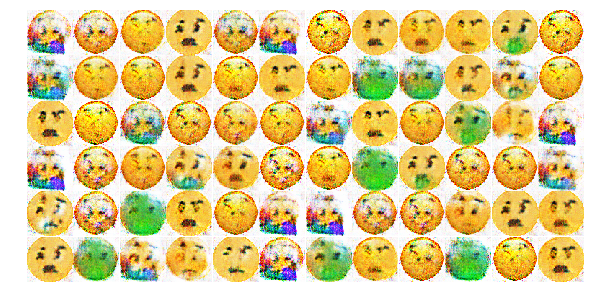

Epoch 1810/20000... Discriminator Loss: 0.3676... Generator Loss: 4.1591
Epoch 1820/20000... Discriminator Loss: 0.3368... Generator Loss: 5.2710
Epoch 1830/20000... Discriminator Loss: 0.3365... Generator Loss: 5.2829
Epoch 1840/20000... Discriminator Loss: 0.3882... Generator Loss: 6.7312
Epoch 1850/20000... Discriminator Loss: 0.3675... Generator Loss: 4.4278
Epoch 1860/20000... Discriminator Loss: 0.3470... Generator Loss: 4.7617
Epoch 1870/20000... Discriminator Loss: 0.3553... Generator Loss: 5.9026
Epoch 1880/20000... Discriminator Loss: 0.3507... Generator Loss: 4.6651
Epoch 1890/20000... Discriminator Loss: 0.3439... Generator Loss: 4.6560
Epoch 1900/20000... Discriminator Loss: 0.3747... Generator Loss: 4.0559
Epoch 1910/20000... Discriminator Loss: 0.4050... Generator Loss: 6.1109
Epoch 1920/20000... Discriminator Loss: 0.3832... Generator Loss: 3.9594
Epoch 1930/20000... Discriminator Loss: 0.3375... Generator Loss: 5.1650
Epoch 1940/20000... Discriminator Loss: 0.3464... G

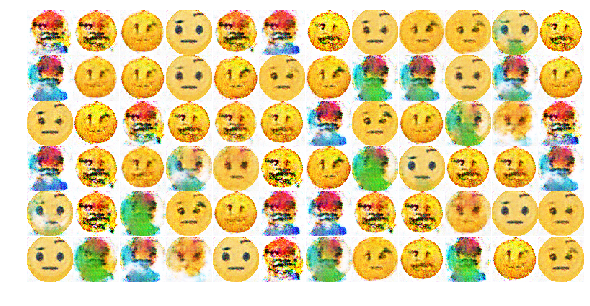

Epoch 2110/20000... Discriminator Loss: 0.3698... Generator Loss: 3.8983
Epoch 2120/20000... Discriminator Loss: 0.3543... Generator Loss: 5.1412
Epoch 2130/20000... Discriminator Loss: 0.3409... Generator Loss: 4.8313
Epoch 2140/20000... Discriminator Loss: 0.3850... Generator Loss: 5.9747
Epoch 2150/20000... Discriminator Loss: 0.3706... Generator Loss: 4.0230
Epoch 2160/20000... Discriminator Loss: 0.3534... Generator Loss: 4.4412
Epoch 2170/20000... Discriminator Loss: 0.3820... Generator Loss: 6.0826
Epoch 2180/20000... Discriminator Loss: 0.3555... Generator Loss: 4.3056
Epoch 2190/20000... Discriminator Loss: 0.3600... Generator Loss: 4.2506
Epoch 2200/20000... Discriminator Loss: 0.3462... Generator Loss: 5.0351
Epoch 2210/20000... Discriminator Loss: 0.3570... Generator Loss: 5.7178
Epoch 2220/20000... Discriminator Loss: 0.3416... Generator Loss: 4.8579
Epoch 2230/20000... Discriminator Loss: 0.3451... Generator Loss: 4.7698
Epoch 2240/20000... Discriminator Loss: 0.3492... G

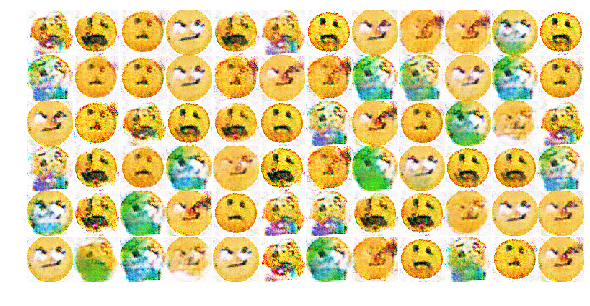

Epoch 2410/20000... Discriminator Loss: 0.3698... Generator Loss: 4.1694
Epoch 2420/20000... Discriminator Loss: 0.3483... Generator Loss: 4.4632
Epoch 2430/20000... Discriminator Loss: 0.3334... Generator Loss: 5.2546
Epoch 2440/20000... Discriminator Loss: 0.3626... Generator Loss: 4.4080
Epoch 2450/20000... Discriminator Loss: 0.3346... Generator Loss: 5.2976
Epoch 2460/20000... Discriminator Loss: 0.3627... Generator Loss: 6.6014
Epoch 2470/20000... Discriminator Loss: 0.3470... Generator Loss: 4.7866
Epoch 2480/20000... Discriminator Loss: 0.3405... Generator Loss: 5.1066
Epoch 2490/20000... Discriminator Loss: 0.3619... Generator Loss: 6.2243
Epoch 2500/20000... Discriminator Loss: 0.3355... Generator Loss: 5.3567
Epoch 2510/20000... Discriminator Loss: 0.3330... Generator Loss: 6.0427
Epoch 2520/20000... Discriminator Loss: 0.3462... Generator Loss: 6.5861
Epoch 2530/20000... Discriminator Loss: 0.3603... Generator Loss: 4.9514
Epoch 2540/20000... Discriminator Loss: 0.3422... G

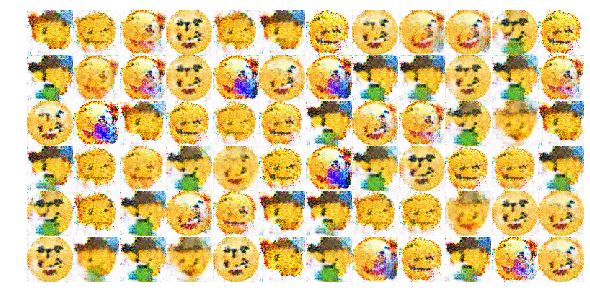

Epoch 2710/20000... Discriminator Loss: 0.3594... Generator Loss: 4.7546
Epoch 2720/20000... Discriminator Loss: 0.3502... Generator Loss: 4.8586
Epoch 2730/20000... Discriminator Loss: 0.3348... Generator Loss: 5.7376
Epoch 2740/20000... Discriminator Loss: 0.3498... Generator Loss: 5.2363
Epoch 2750/20000... Discriminator Loss: 0.3445... Generator Loss: 7.1111
Epoch 2760/20000... Discriminator Loss: 0.3369... Generator Loss: 5.1860
Epoch 2770/20000... Discriminator Loss: 0.3302... Generator Loss: 5.7522
Epoch 2780/20000... Discriminator Loss: 0.3523... Generator Loss: 5.1038
Epoch 2790/20000... Discriminator Loss: 0.3476... Generator Loss: 6.1265
Epoch 2800/20000... Discriminator Loss: 0.3295... Generator Loss: 5.9469
Epoch 2810/20000... Discriminator Loss: 0.3402... Generator Loss: 5.2845
Epoch 2820/20000... Discriminator Loss: 0.3748... Generator Loss: 6.3164
Epoch 2830/20000... Discriminator Loss: 0.3361... Generator Loss: 5.5876
Epoch 2840/20000... Discriminator Loss: 0.3368... G

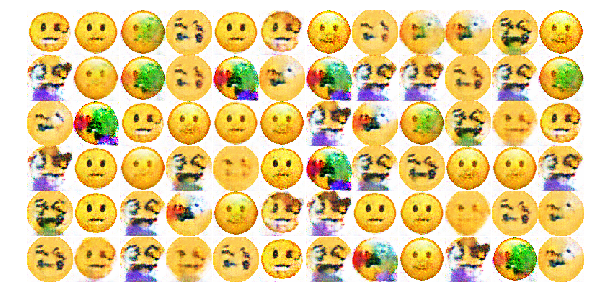

Epoch 3010/20000... Discriminator Loss: 0.3502... Generator Loss: 4.4283
Epoch 3020/20000... Discriminator Loss: 0.3434... Generator Loss: 4.7189
Epoch 3030/20000... Discriminator Loss: 0.3554... Generator Loss: 5.8857
Epoch 3040/20000... Discriminator Loss: 0.3626... Generator Loss: 4.2729
Epoch 3050/20000... Discriminator Loss: 0.3392... Generator Loss: 4.8871
Epoch 3060/20000... Discriminator Loss: 0.3656... Generator Loss: 6.0322
Epoch 3070/20000... Discriminator Loss: 0.3654... Generator Loss: 4.1980
Epoch 3080/20000... Discriminator Loss: 0.3508... Generator Loss: 4.4925
Epoch 3090/20000... Discriminator Loss: 0.3866... Generator Loss: 6.0714
Epoch 3100/20000... Discriminator Loss: 0.3436... Generator Loss: 4.6550
Epoch 3110/20000... Discriminator Loss: 0.3399... Generator Loss: 5.8076
Epoch 3120/20000... Discriminator Loss: 0.3505... Generator Loss: 4.6955
Epoch 3130/20000... Discriminator Loss: 0.3500... Generator Loss: 5.2168
Epoch 3140/20000... Discriminator Loss: 0.3533... G

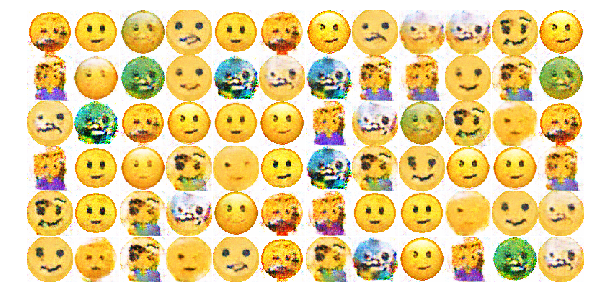

Epoch 3310/20000... Discriminator Loss: 0.3326... Generator Loss: 5.5761
Epoch 3320/20000... Discriminator Loss: 0.3336... Generator Loss: 5.4138
Epoch 3330/20000... Discriminator Loss: 0.3377... Generator Loss: 5.2702
Epoch 3340/20000... Discriminator Loss: 0.3348... Generator Loss: 5.6476
Epoch 3350/20000... Discriminator Loss: 0.3679... Generator Loss: 4.3234
Epoch 3360/20000... Discriminator Loss: 0.3403... Generator Loss: 5.0784
Epoch 3370/20000... Discriminator Loss: 0.3704... Generator Loss: 6.2788
Epoch 3380/20000... Discriminator Loss: 0.3577... Generator Loss: 4.6151
Epoch 3390/20000... Discriminator Loss: 0.3510... Generator Loss: 4.5708
Epoch 3400/20000... Discriminator Loss: 0.3675... Generator Loss: 6.0045
Epoch 3410/20000... Discriminator Loss: 0.3516... Generator Loss: 4.7658
Epoch 3420/20000... Discriminator Loss: 0.3498... Generator Loss: 4.5746
Epoch 3430/20000... Discriminator Loss: 0.3667... Generator Loss: 6.4071
Epoch 3440/20000... Discriminator Loss: 0.3631... G

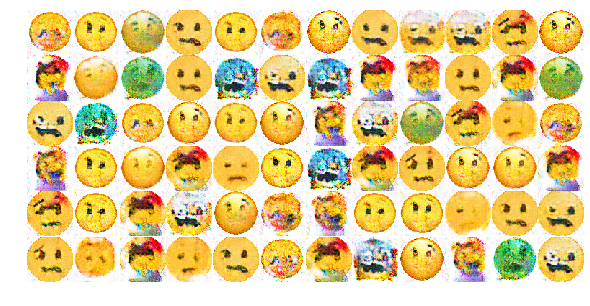

Epoch 3610/20000... Discriminator Loss: 0.3421... Generator Loss: 6.1267
Epoch 3620/20000... Discriminator Loss: 0.3485... Generator Loss: 4.5817
Epoch 3630/20000... Discriminator Loss: 0.3543... Generator Loss: 6.4241
Epoch 3640/20000... Discriminator Loss: 0.3362... Generator Loss: 5.0225
Epoch 3650/20000... Discriminator Loss: 0.3333... Generator Loss: 5.5331
Epoch 3660/20000... Discriminator Loss: 0.3682... Generator Loss: 6.4487
Epoch 3670/20000... Discriminator Loss: 0.3408... Generator Loss: 4.8931
Epoch 3680/20000... Discriminator Loss: 0.3445... Generator Loss: 4.8132
Epoch 3690/20000... Discriminator Loss: 0.3684... Generator Loss: 5.8273
Epoch 3700/20000... Discriminator Loss: 0.3503... Generator Loss: 4.8217
Epoch 3710/20000... Discriminator Loss: 0.3432... Generator Loss: 4.9629
Epoch 3720/20000... Discriminator Loss: 0.3585... Generator Loss: 5.5940
Epoch 3730/20000... Discriminator Loss: 0.3342... Generator Loss: 5.4432
Epoch 3740/20000... Discriminator Loss: 0.3371... G

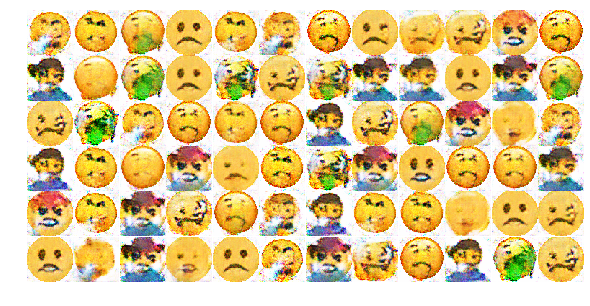

Epoch 3910/20000... Discriminator Loss: 0.3407... Generator Loss: 5.2342
Epoch 3920/20000... Discriminator Loss: 0.3436... Generator Loss: 5.9783
Epoch 3930/20000... Discriminator Loss: 0.3850... Generator Loss: 4.1092
Epoch 3940/20000... Discriminator Loss: 0.3394... Generator Loss: 5.0854
Epoch 3950/20000... Discriminator Loss: 0.3659... Generator Loss: 6.1373
Epoch 3960/20000... Discriminator Loss: 0.3350... Generator Loss: 5.6695
Epoch 3970/20000... Discriminator Loss: 0.3301... Generator Loss: 6.0193
Epoch 3980/20000... Discriminator Loss: 0.3476... Generator Loss: 5.9978
Epoch 3990/20000... Discriminator Loss: 0.3398... Generator Loss: 5.2624
Epoch 4000/20000... Discriminator Loss: 0.3449... Generator Loss: 5.0169
Epoch 4010/20000... Discriminator Loss: 0.3335... Generator Loss: 6.2766
Epoch 4020/20000... Discriminator Loss: 0.3425... Generator Loss: 5.1541
Epoch 4030/20000... Discriminator Loss: 0.3328... Generator Loss: 6.2294
Epoch 4040/20000... Discriminator Loss: 0.3403... G

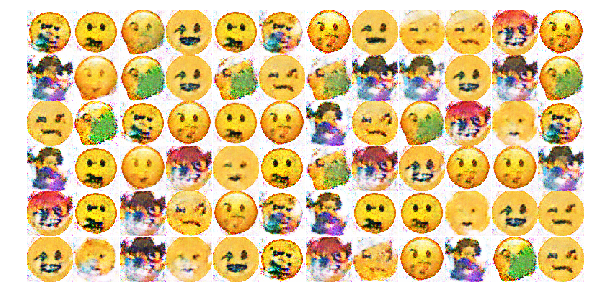

Epoch 4210/20000... Discriminator Loss: 0.3337... Generator Loss: 6.5747
Epoch 4220/20000... Discriminator Loss: 0.3410... Generator Loss: 5.0841
Epoch 4230/20000... Discriminator Loss: 0.3343... Generator Loss: 6.2364
Epoch 4240/20000... Discriminator Loss: 0.3375... Generator Loss: 6.8218
Epoch 4250/20000... Discriminator Loss: 0.3305... Generator Loss: 6.3119
Epoch 4260/20000... Discriminator Loss: 0.3544... Generator Loss: 5.1754
Epoch 4270/20000... Discriminator Loss: 0.3682... Generator Loss: 7.3789
Epoch 4280/20000... Discriminator Loss: 0.3348... Generator Loss: 6.6172
Epoch 4290/20000... Discriminator Loss: 0.3567... Generator Loss: 6.7525
Epoch 4300/20000... Discriminator Loss: 0.3589... Generator Loss: 5.0503
Epoch 4310/20000... Discriminator Loss: 0.3312... Generator Loss: 6.1187
Epoch 4320/20000... Discriminator Loss: 0.3356... Generator Loss: 6.5926
Epoch 4330/20000... Discriminator Loss: 0.3390... Generator Loss: 5.5546
Epoch 4340/20000... Discriminator Loss: 0.3465... G

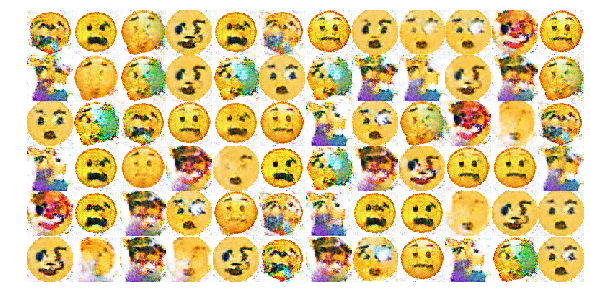

Epoch 4510/20000... Discriminator Loss: 0.3489... Generator Loss: 5.8614
Epoch 4520/20000... Discriminator Loss: 0.3391... Generator Loss: 5.5881
Epoch 4530/20000... Discriminator Loss: 0.3301... Generator Loss: 6.2175
Epoch 4540/20000... Discriminator Loss: 0.3294... Generator Loss: 6.5399
Epoch 4550/20000... Discriminator Loss: 0.3367... Generator Loss: 5.1760
Epoch 4560/20000... Discriminator Loss: 0.3437... Generator Loss: 7.0043
Epoch 4570/20000... Discriminator Loss: 0.3474... Generator Loss: 5.1791
Epoch 4580/20000... Discriminator Loss: 0.3376... Generator Loss: 5.7053
Epoch 4590/20000... Discriminator Loss: 0.3381... Generator Loss: 5.2295
Epoch 4600/20000... Discriminator Loss: 0.3435... Generator Loss: 5.3554
Epoch 4610/20000... Discriminator Loss: 0.3539... Generator Loss: 5.3051
Epoch 4620/20000... Discriminator Loss: 0.3367... Generator Loss: 5.4209
Epoch 4630/20000... Discriminator Loss: 0.3378... Generator Loss: 6.1387
Epoch 4640/20000... Discriminator Loss: 0.3312... G

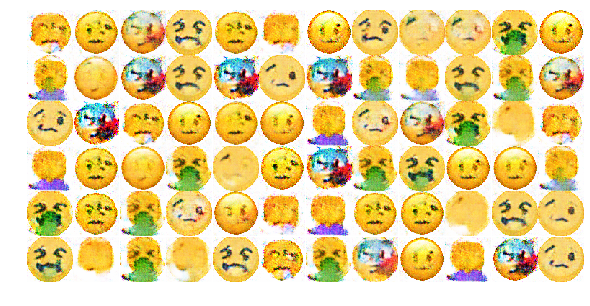

Epoch 4810/20000... Discriminator Loss: 0.3343... Generator Loss: 5.7421
Epoch 4820/20000... Discriminator Loss: 0.3452... Generator Loss: 5.2023
Epoch 4830/20000... Discriminator Loss: 0.3337... Generator Loss: 5.8177
Epoch 4840/20000... Discriminator Loss: 0.3485... Generator Loss: 6.7740
Epoch 4850/20000... Discriminator Loss: 0.3402... Generator Loss: 5.4224
Epoch 4860/20000... Discriminator Loss: 0.3374... Generator Loss: 5.3970
Epoch 4870/20000... Discriminator Loss: 0.3503... Generator Loss: 6.4417
Epoch 4880/20000... Discriminator Loss: 0.3401... Generator Loss: 5.3444
Epoch 4890/20000... Discriminator Loss: 0.3450... Generator Loss: 5.0026
Epoch 4900/20000... Discriminator Loss: 0.3579... Generator Loss: 7.1481
Epoch 4910/20000... Discriminator Loss: 0.3383... Generator Loss: 7.1873
Epoch 4920/20000... Discriminator Loss: 0.3338... Generator Loss: 5.7268
Epoch 4930/20000... Discriminator Loss: 0.3372... Generator Loss: 5.6629
Epoch 4940/20000... Discriminator Loss: 0.3514... G

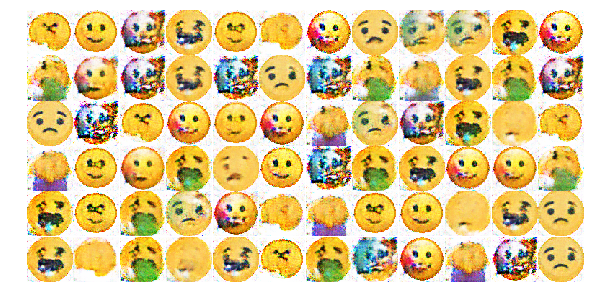

Epoch 5110/20000... Discriminator Loss: 0.3388... Generator Loss: 6.5511
Epoch 5120/20000... Discriminator Loss: 0.3465... Generator Loss: 5.7594
Epoch 5130/20000... Discriminator Loss: 0.3365... Generator Loss: 5.2101
Epoch 5140/20000... Discriminator Loss: 0.3415... Generator Loss: 7.3700
Epoch 5150/20000... Discriminator Loss: 0.3371... Generator Loss: 5.3593
Epoch 5160/20000... Discriminator Loss: 0.3620... Generator Loss: 4.8776
Epoch 5170/20000... Discriminator Loss: 0.3293... Generator Loss: 6.4728
Epoch 5180/20000... Discriminator Loss: 0.3403... Generator Loss: 5.2185
Epoch 5190/20000... Discriminator Loss: 0.3348... Generator Loss: 5.6807
Epoch 5200/20000... Discriminator Loss: 0.3466... Generator Loss: 5.5462
Epoch 5210/20000... Discriminator Loss: 0.3497... Generator Loss: 7.4207
Epoch 5220/20000... Discriminator Loss: 0.3496... Generator Loss: 5.2863
Epoch 5230/20000... Discriminator Loss: 0.3352... Generator Loss: 5.7890
Epoch 5240/20000... Discriminator Loss: 0.3440... G

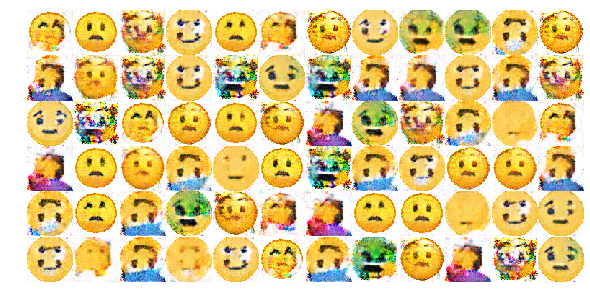

Epoch 5410/20000... Discriminator Loss: 0.3553... Generator Loss: 5.0471
Epoch 5420/20000... Discriminator Loss: 0.3563... Generator Loss: 5.1953
Epoch 5430/20000... Discriminator Loss: 0.3531... Generator Loss: 7.0691
Epoch 5440/20000... Discriminator Loss: 0.3883... Generator Loss: 4.2536
Epoch 5450/20000... Discriminator Loss: 0.3519... Generator Loss: 5.1007
Epoch 5460/20000... Discriminator Loss: 0.3881... Generator Loss: 7.3702
Epoch 5470/20000... Discriminator Loss: 0.3358... Generator Loss: 6.5151
Epoch 5480/20000... Discriminator Loss: 0.3310... Generator Loss: 6.0366
Epoch 5490/20000... Discriminator Loss: 0.3471... Generator Loss: 4.9811
Epoch 5500/20000... Discriminator Loss: 0.3322... Generator Loss: 5.7113
Epoch 5510/20000... Discriminator Loss: 0.3409... Generator Loss: 6.6655
Epoch 5520/20000... Discriminator Loss: 0.3550... Generator Loss: 6.2557
Epoch 5530/20000... Discriminator Loss: 0.3349... Generator Loss: 5.5884
Epoch 5540/20000... Discriminator Loss: 0.3452... G

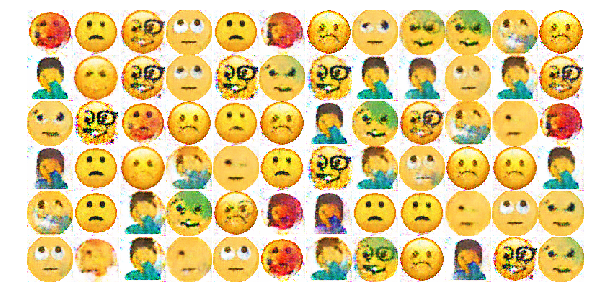

Epoch 5710/20000... Discriminator Loss: 0.3310... Generator Loss: 6.4592
Epoch 5720/20000... Discriminator Loss: 0.3476... Generator Loss: 6.0988
Epoch 5730/20000... Discriminator Loss: 0.3509... Generator Loss: 4.9167
Epoch 5740/20000... Discriminator Loss: 0.3535... Generator Loss: 5.1168
Epoch 5750/20000... Discriminator Loss: 0.3390... Generator Loss: 5.9862


In [0]:
# Load the data and train the network here
losses, samples = train(net, images, epochs, batch_size, print_every=10, 
                        show_every=300, figsize=(10,5))

In [0]:
# def get_discriminator(optimizer):
#     discriminator = Sequential()
#     discriminator.add(Dense(
#         1024, input_dim=784,
#         kernel_initializer=initializers.RandomNormal(stddev=0.02)))
#     discriminator.add(LeakyReLU(0.2))
#     discriminator.add(Dropout(0.3))
 
#     discriminator.add(Dense(512))
#     discriminator.add(LeakyReLU(0.2))
#     discriminator.add(Dropout(0.3))
 
#     discriminator.add(Dense(256))
#     discriminator.add(LeakyReLU(0.2))
#     discriminator.add(Dropout(0.3))
 
#     discriminator.add(Dense(1, activation='sigmoid'))
#     discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
#     return discriminator

# def get_generator(optimizer):
#     generator = Sequential()
#     generator.add(Dense(
#         256, input_dim=random_dim,
#         kernel_initializer=initializers.RandomNormal(stddev=0.02)))
#     generator.add(LeakyReLU(0.2))
 
#     generator.add(Dense(512))
#     generator.add(LeakyReLU(0.2))
 
#     generator.add(Dense(1024))
#     generator.add(LeakyReLU(0.2))
 
#     generator.add(Dense(784, activation='tanh'))
#     generator.compile(loss='binary_crossentropy', optimizer=optimizer)
#     return generator

# def get_gan_network(discriminator, random_dim, generator, optimizer):
#     # We initially set trainable to False since we only want to train either the 
#     # generator or discriminator at a time
#     discriminator.trainable = False
#     # gan input (noise) will be 100-dimensional vectors
#     gan_input = Input(shape=(random_dim,))
#     # the output of the generator (an image)
#     x = generator(gan_input)
#     # get the output of the discriminator (probability if the image is real/not)
#     gan_output = discriminator(x)
#     gan = Model(inputs=gan_input, outputs=gan_output)
#     gan.compile(loss='binary_crossentropy', optimizer=optimizer)
#     return gan

# def plot_generated_images(epoch, generator, examples=100, dim=(10, 10),
#                           figsize=(10, 10)):
#     noise = np.random.normal(0, 1, size=[examples, random_dim])
#     generated_images = generator.predict(noise)
#     generated_images = generated_images.reshape(examples, 28, 28)
 
#     plt.figure(figsize=figsize)
#     for i in range(generated_images.shape[0]):
#         plt.subplot(dim[0], dim[1], i+1)
#         plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
#         plt.axis('off')
#     plt.tight_layout()
#     plt.savefig('gan_generated_image_epoch_%d.png' % epoch)

In [0]:
# def train(epochs=1, batch_size=128):
#     # Get the training and testing data
#     x_train, y_train, x_test, y_test = load_minst_data()
#     # Split the training data into batches of size 128
#     batch_count = x_train.shape[0] // batch_size
 
#     # Build our GAN netowrk
#     adam = Adam(lr=0.0002, beta_1=0.5)
#     generator = get_generator(adam)
#     discriminator = get_discriminator(adam)
#     gan = get_gan_network(discriminator, random_dim, generator, adam)
 
#     for e in range(1, epochs+1):
#         print ('-'*15, 'Epoch %d' % e, '-'*15)
#         for _ in tqdm(range(batch_count)):
#             # Get a random set of input noise and images
#             noise = np.random.normal(0, 1, size=[batch_size, random_dim])
#             image_batch = x_train[np.random.randint(0, x_train.shape[0],
#                                                     size=batch_size)]
 
#             # Generate fake MNIST images
#             generated_images = generator.predict(noise)
#             X = np.concatenate([image_batch, generated_images])
 
#             # Labels for generated and real data
#             y_dis = np.zeros(2*batch_size)
#             # One-sided label smoothing
#             y_dis[:batch_size] = 0.9
 
#             # Train discriminator
#             discriminator.trainable = True
#             discriminator.train_on_batch(X, y_dis)
 
#             # Train generator
#             noise = np.random.normal(0, 1, size=[batch_size, random_dim])
#             y_gen = np.ones(batch_size)
#             discriminator.trainable = False
#             gan.train_on_batch(noise, y_gen)
 
#         if e == 1 or e % 20 == 0:
#             plot_generated_images(e, generator)
 
# train(40, 64)